## Load functions and data

In [1]:
# Enable autoreload extension to automatically reload modules
%load_ext autoreload
%autoreload 1

# Import necessary modules and libraries
from AirSeaFluxCode import AirSeaFluxCode  # Import AirSeaFluxCode class from AirSeaFluxCode module
import xarray as xr  # Import xarray library with alias xr
import gsw_xarray as gsw  # Import gsw_xarray module with alias gsw
import matplotlib.dates as mdates  # Import module for working with dates in matplotlib
import matplotlib.pyplot as plt  # Import matplotlib.pyplot for plotting
import numpy as np  # Import numpy library with alias np for numerical operations
import cartopy.crs as ccrs  # Import cartopy for geospatial data visualization
import cmocean.cm as cmo  # Import colormaps from cmocean for oceanography
from matplotlib.lines import Line2D
import statsmodels.api as sm
from matplotlib.ticker import FuncFormatter
from tqdm.notebook import tqdm_notebook as tqdm
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)

RuntimeWarning
# Import my_funcs module for interactive reloading
%aimport my_funcs

# Call update_params function from my_funcs module to update parameters
my_funcs.update_params(fontsize=24)

# Define a function to customize x-axis ticks on a plot
def fix_xticks(ax):
    ax.xaxis.set_major_locator(mdates.MonthLocator())  # Set major ticks to display month
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%b"))  # Format major ticks as abbreviated month (e.g., Jan)
    # Set x-axis label to '2019'
    ax.set_xlabel('2019')

# Define color variables with hexadecimal color codes
c20 = "#C13F89"  # Define color c20
c22 = "#3ec177"  # Define color c22
c23 = "#3e88c1"  # Define color c23
ext = "#a43ec1"  # Define color ext

# Manually create Line2D objects for legend handles
legend_handles = [
    Line2D([], [], color=c20, lw=3, label='SD1020'),
    Line2D([], [], color=c22, lw=3, label='SD1022'),
    Line2D([], [], color=c23, lw=3, label='SD1023')
]

def km_formatter(x, pos):
    return f'{x / 1000:.0f} km'

In [2]:
# Load SD1020 ADCP and dataset, squeeze and swap dimensions
adcp = xr.open_dataset('../data/saildrone-gen_5-antarctica_circumnavigation_2019-sd1020-20190119T040000-20190803T043000-1_minutes-v1.1597092482498.nc')\
        .squeeze().swap_dims({'obs':'time'})
ds20 = xr.open_dataset('../data/saildrone-gen_5-antarctica_circumnavigation_2019-sd1020-20190119T040000-20190803T043000-1_minutes-v1.1620360815446.nc')\
        .squeeze().swap_dims({'obs':'time'})

# Load SD1022 and SD1023 datasets, and set coordinates
ds22 = xr.open_dataset('../data/Sd1022_data_merged.nc').set_coords(['longitude','latitude'])
ds23 = xr.open_dataset('../data/Sd1023_data_merged.nc').set_coords(['longitude','latitude'])

In [4]:
ds20 = ds20.interpolate_na('time')
ds22 = ds22.interpolate_na('time')
ds23 = ds23.interpolate_na('time')

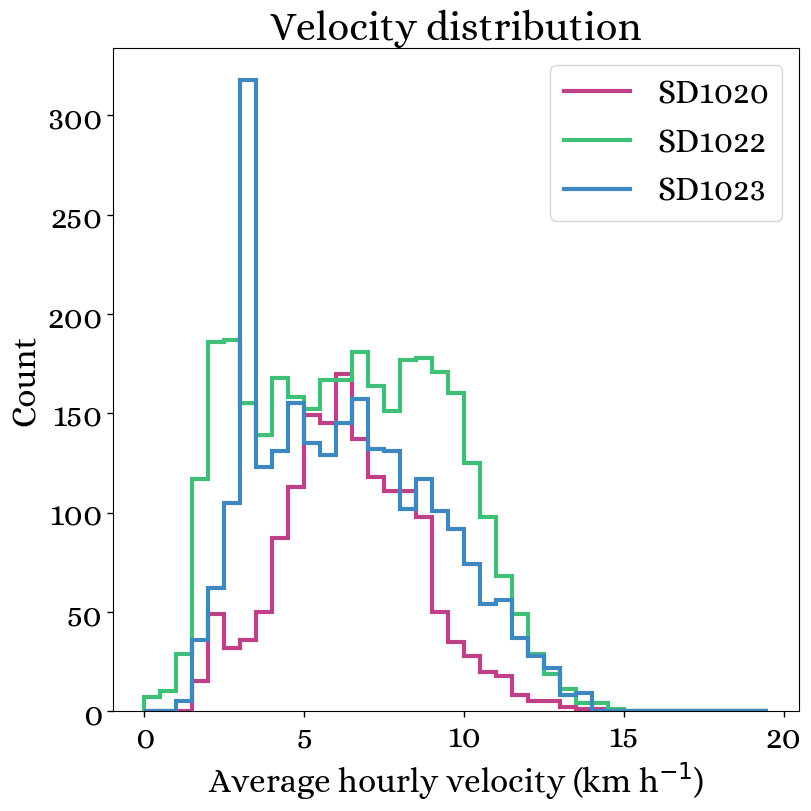

In [149]:
fig,ax=plt.subplots(figsize=(8,8),constrained_layout=True,sharey=True)

_=(ds20["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c20,lw=3)
_=(ds22["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c22,lw=3)
_=(ds23["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c23,lw=3)

ax.legend(handles=legend_handles, loc='upper right',ncols=1)

ax.set(title="Velocity distribution",
       xlabel="Average hourly velocity (km h$^{-1}$)",
       ylabel="Count")

plt.show()

## Calculate wind speed and air-sea fluxes

In [5]:
def calc_ws_wd(ds):
    """
    Calculates wind speed and wind direction from zonal (UWND_MEAN) and meridional (VWND_MEAN) wind components.

    Parameters:
    - ds (xarray.Dataset): Dataset containing zonal and meridional wind components.

    Returns:
    - ds (xarray.Dataset): Dataset with the calculated wind speed and wind direction added as new variables 'wind_speed' and 'wind_direction'.
    """
    # Calculate wind speed using the square root of the sum of squares of zonal and meridional wind components
    ds['wind_speed'] = np.sqrt(ds['UWND_MEAN']**2 + ds['VWND_MEAN']**2)

    # Calculate wind direction using arctan2 function
    ds['wind_direction'] = np.arctan2(ds['VWND_MEAN'], ds['UWND_MEAN']) * (180 / np.pi)
    ds['wind_direction'] = (ds['wind_direction'] + 360) % 360  # Convert negative angles to positive
    
    return ds

In [6]:
# Calculate wind speed and wind direction for SD1020 dataset
ds20 = calc_ws_wd(ds20)

# Calculate wind speed and wind direction for SD1022 dataset
ds22 = calc_ws_wd(ds22)

# Calculate wind speed and wind direction for SD1023 dataset
ds23 = calc_ws_wd(ds23)


In [7]:
ds20['sal'] = ds20['SAL_RBR_MEAN'].copy().rolling(time=5,center=True).median('time')
ds20['sal'] = ds20['sal'].where(ds20['sal'] > 33.5)
ds22['sal'] = ds22['SAL_RBR_MEAN'].copy().rolling(time=5,center=True).median('time')
ds22['sal'] = ds22['sal'].where(ds22['sal'] > 33)
ds23['sal'] = ds23['SAL_RBR_MEAN'].copy().rolling(time=5,center=True).median('time')
ds23['sal'] = ds23['sal'].where(ds23['sal'] > 33.5)

In [8]:
ds20['sal'] = ds20['sal'].where(ds20['sal'].diff('time') < 0.01).interpolate_na('time')
ds22['sal'] = ds22['sal'].where(ds22['sal'].diff('time') < 0.01).interpolate_na('time')
ds23['sal'] = ds23['sal'].where(ds23['sal'].diff('time') < 0.01).interpolate_na('time')

## Temporal autocorrelation

In [9]:
ds20 = ds20.isel(time=slice(0,95630))

In [10]:
def sin(ds,n):
    # Define the time dimension
    time = ds.time

    # Generate the sinusoidal variable with a period of 10 minutes
    frequency = 1 / n  # Frequency in Hz
    amplitude = 1  # Amplitude of the sinusoidal variable
    phase = 0  # Phase shift of the sinusoidal variable
    sinusoidal_variable = amplitude * np.sin(2 * np.pi * frequency * np.arange(len(time)) + phase)
    return sinusoidal_variable

In [75]:
import numpy as np

def red_noise(ds, n, amplitude=0.1):
    # Define the time dimension
    time = ds.time

    # Generate red noise with the same length as the sinusoidal variable
    red_noise = np.random.randn(len(time))

    # Apply a filter to make the noise "red"
    b = np.ones(n) / n
    red_noise = np.convolve(red_noise, b, mode='same')

    # Scale the amplitude of the noise
    red_noise *= amplitude

    return red_noise

def sin_with_red_noise(ds, n, red_noise_amplitude=0.1):
    # Generate the sinusoidal variable
    sinusoidal_variable = sin(ds, n)

    # Generate red noise
    noise = red_noise(ds, n, amplitude=red_noise_amplitude)

    # Add red noise to the sinusoidal signal
    signal_with_noise = sinusoidal_variable + noise

    return signal_with_noise


In [16]:
ds20["sin05"] = ('time'), sin(ds20,5)
ds20["sin09"] = ('time'), sin(ds20,9)
ds20["sin10"] = ('time'), sin(ds20,10)
ds20["sin11"] = ('time'), sin(ds20,11)
ds20["sin20"] = ('time'), sin(ds20,20)
ds20["sin60"] = ('time'), sin(ds20,60)

In [17]:
def calc_and_plot_acv(ax, ds, var, tw, c, start_time, end_time, shift=0):
    """
    Function to calculate and plot autocorrelation values.

    Parameters:
        ax (matplotlib.axes.Axes): The axes object to plot on.
        ds (xarray.Dataset): The dataset containing the variable data.
        var (str): The variable to calculate autocorrelation for.
        tw (int): The time window size for autocorrelation calculation.
        c (str): Color of the plotted lines.
        start_time (str): Start time for data extraction (format: 'YYYY-MM-DD').
        end_time (str): End time for data extraction (format: 'YYYY-MM-DD').
        shift (int, optional): Time shift for autocorrelation calculation. Defaults to 0.

    Returns:
        list: List of autocorrelation values calculated.
    """

    # Extract data for the variable from the dataset
    x = ds[var].isel(time=slice(start_time, end_time)).interpolate_na('time').values

    # Mask NaN values
    msk = np.isfinite(x)
    x = x[msk]

    acf = []
    # Calculate autocorrelations
    for i in range(int(len(x) / tw)):
        # Calculate autocorrelation for the current time window
        ac = sm.tsa.acf(x[tw*i + shift: tw*(i+1) + 1 + shift], nlags=tw, missing='conservative')
        # Plot autocorrelation values on the provided axes
        ax.plot(ac, c=c, alpha=0.05, zorder=2)

        # Append autocorrelation values to the list
        acf.append(ac)

    return acf


In [21]:
def plot_acf_panels(ds,tw,start_time,end_time,c):
    # Define variables, titles, units, and colors for plotting
    variables = ['wind_speed', 'TEMP_AIR_MEAN', 'RH_MEAN', 'TEMP_CTD_RBR_MEAN', 'SAL_RBR_MEAN']
    titles = ['Wind speed', 'Air temperature', 'Relative humidity', 'Sea surface temperature', 'Sea surface salinity']
    units = ["m s$^{-1}$", "°C", "%", "°C", "PSU"]
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

    # Create subplots
    fig, ax = plt.subplots(int(len(variables)), 3, constrained_layout=True, figsize=(32, 16), sharex='col')

    # Set time window for autocorrelation calculation
    #tw = 60 * 1

    # Loop through variables to calculate and plot autocorrelation
    acf = []
    for axs, var, t in zip(ax.T[0], variables, titles):
        acf.append(calc_and_plot_acv(axs, ds, var, tw, c, start_time, end_time, shift=0))
        # Set labels and limits for the subplot
        axs.set(xlabel='Time lag (min)' if "SAL" in var else "", xlim=(-1, tw), ylabel="ACF")
        axs.set_title(t, loc='right', x=0.975, y=0.85, c=c, fontweight='bold')
        axs.axhline(0, ls='--', zorder=1, c='k', lw=1)
        axs.set(ylim=(-0.6, 1.1))

    # Plot mean autocorrelation with standard deviation on the second column of subplots
    for axs, i, l in zip(ax.T[1], range(6), titles):
        axs.plot(np.nanmean(acf[i][:-1], axis=0), label=f"Mean ACF", lw=3, c=c, zorder=2)
        axs.fill_between(np.arange(0, tw+1, 1), np.nanmean(acf[i][:-1], axis=0)-np.nanstd(acf[i][:-1], axis=0),
                         np.nanmean(acf[i][:-1], axis=0)+np.nanstd(acf[i][:-1], axis=0),
                         label=r"$\pm$ 1$\sigma$", lw=3, fc=c, ec='None', alpha=0.2, zorder=2)
        axs.axhline(0, lw=1, ls='--', zorder=1, c='k')
        axs.legend(ncols=2, fontsize='small')
        axs.set(ylim=(-0.6, 1.1), yticklabels=[])

    # Plot actual variable data on the third column of subplots
    variables[-2] = 'sal'
    for axs, var, t, u in zip(ax.T[2], variables, titles, units):
        ds[var].isel(time=slice(start_time, end_time)).rolling(time=3, center=True).median('time').plot(ax=axs, c=c, lw=3)
        axs.set(ylabel=f"({u})", title='', xlabel="")
        # Set specific limits for the last subplot
        ax.T[2][2].set(ylim=(50, 105))

    # Fix x-axis ticks based on the data range
    my_funcs.fix_xticks([axs], ds.isel(time=slice(start_time, end_time)))
    return acf

In [13]:
def plot_acf_panels_test(ds,tw,start_time,end_time,c):
    # Define variables, titles, units, and colors for plotting
    variables = ['sin05', 'sin09', 'sin10', 'sin11', 'sin20',"sin60"]
    titles = ['Sinusoidal, 5 min', 'Sinusoidal, 9 min', 'Sinusoidal, 10 min', 'Sinusoidal, 11 min', 'Sinusoidal, 20 min',"Sinusoidal, 60 min"]
    units = ["1", "1", "1", "1", "1", "1"]
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

    # Create subplots
    fig, ax = plt.subplots(int(len(variables)), 3, constrained_layout=True, figsize=(32, 16), sharex='col')

    # Set time window for autocorrelation calculation
    #tw = 60 * 1

    # Loop through variables to calculate and plot autocorrelation
    acf = []
    for axs, var, t in zip(ax.T[0], variables, titles):
        acf.append(calc_and_plot_acv(axs, ds, var, tw, c, start_time, end_time, shift=0))
        # Set labels and limits for the subplot
        axs.set(xlabel='Time lag (min)' if "60" in var else "", xlim=(-1, tw), ylabel="ACF")
        axs.set_title(t, loc='right', x=0.975, y=0.85, c=c, fontweight='bold')
        axs.axhline(0, ls='--', zorder=1, c='k', lw=1)
        axs.set(ylim=(-0.6, 1.1))

    # Plot mean autocorrelation with standard deviation on the second column of subplots
    for axs, i, l in zip(ax.T[1], range(6), titles):
        axs.plot(np.nanmean(acf[i][:-1], axis=0), label=f"Mean ACF", lw=3, c=c, zorder=2)
        axs.fill_between(np.arange(0, tw+1, 1), np.nanmean(acf[i][:-1], axis=0)-np.nanstd(acf[i][:-1], axis=0),
                         np.nanmean(acf[i][:-1], axis=0)+np.nanstd(acf[i][:-1], axis=0),
                         label=r"$\pm$ 1$\sigma$", lw=3, fc=c, ec='None', alpha=0.2, zorder=2)
        axs.axhline(0, lw=1, ls='--', zorder=1, c='k')
        axs.legend(ncols=2, fontsize='small')
        axs.set(ylim=(-0.6, 1.1), yticklabels=[])

    # Plot actual variable data on the third column of subplots
    #variables[-2] = 'sal'
    for axs, var, t, u in zip(ax.T[2], variables, titles, units):
        ds[var].isel(time=slice(start_time, end_time)).rolling(time=3, center=True).median('time').plot(ax=axs, c=c, lw=3)
        axs.set(ylabel=f"({u})", title='', xlabel="")
        # Set specific limits for the last subplot
        #ax.T[2][2].set(ylim=(50, 105))

    # Fix x-axis ticks based on the data range
    my_funcs.fix_xticks([axs], ds.isel(time=slice(start_time, end_time)))
    return acf

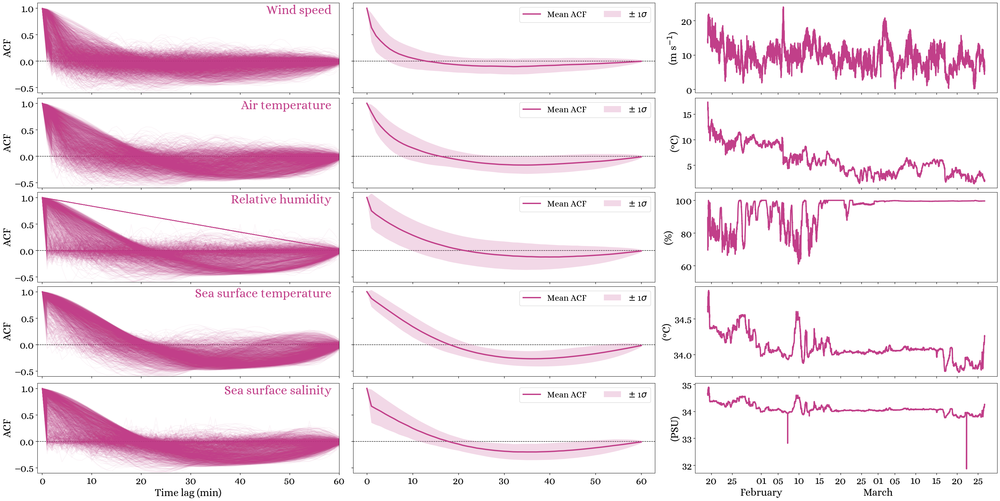

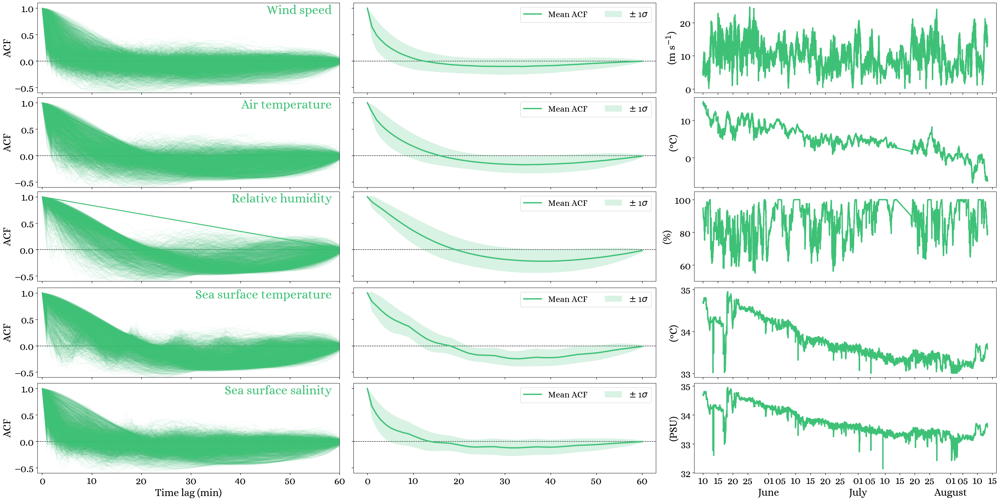

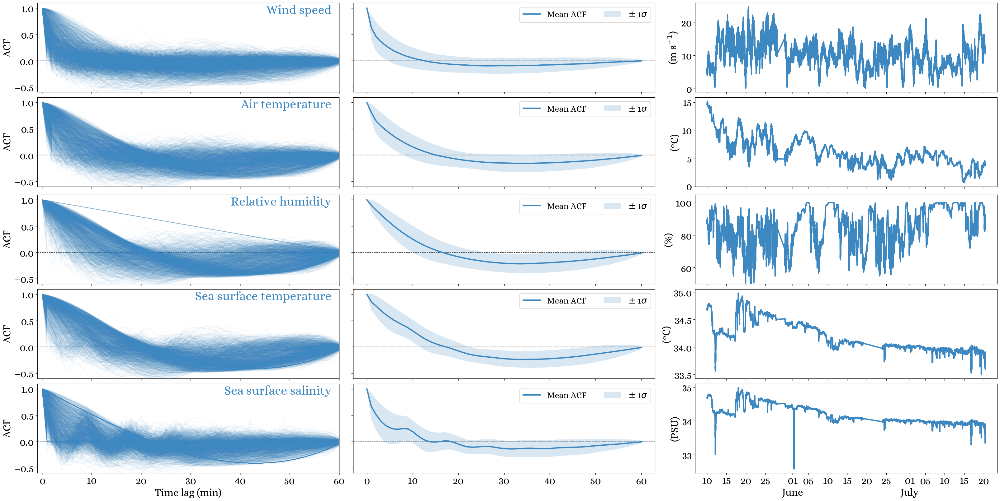

In [51]:
acf20 = plot_acf_panels(ds20,60,0,95630,c20)
acf22 = plot_acf_panels(ds22,60,0,137268,c22)
acf23 = plot_acf_panels(ds23,60,0,99996,c23)

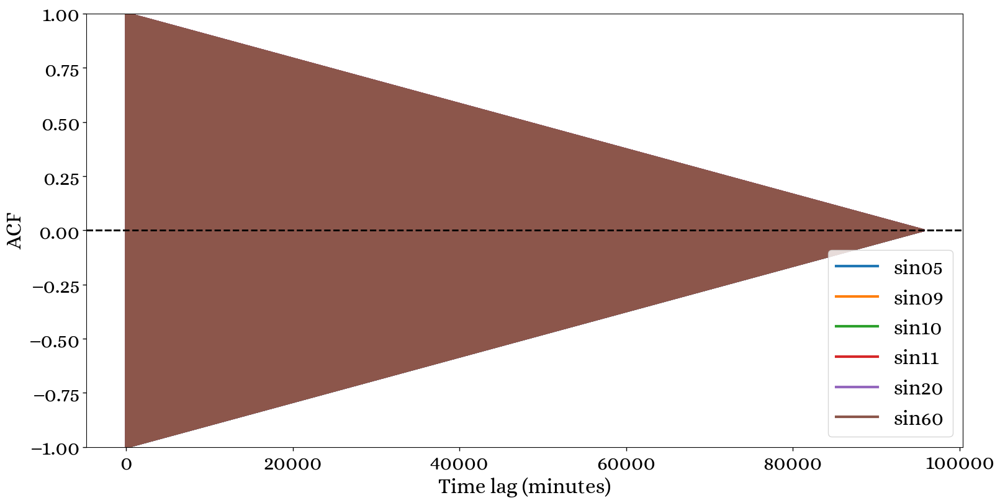

In [521]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

variables = ['sin05', 'sin09', 'sin10', 'sin11', 'sin20',"sin60"]
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for var,c in zip(variables,colors):
    ax.plot(sm.tsa.acf(ds20[var].values,nlags=len(ds20.time)),c=c,label=var,lw=3)
    ax.axhline(0,ls='--',lw=2,c='k')
    ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1))
ax.legend()
plt.show()

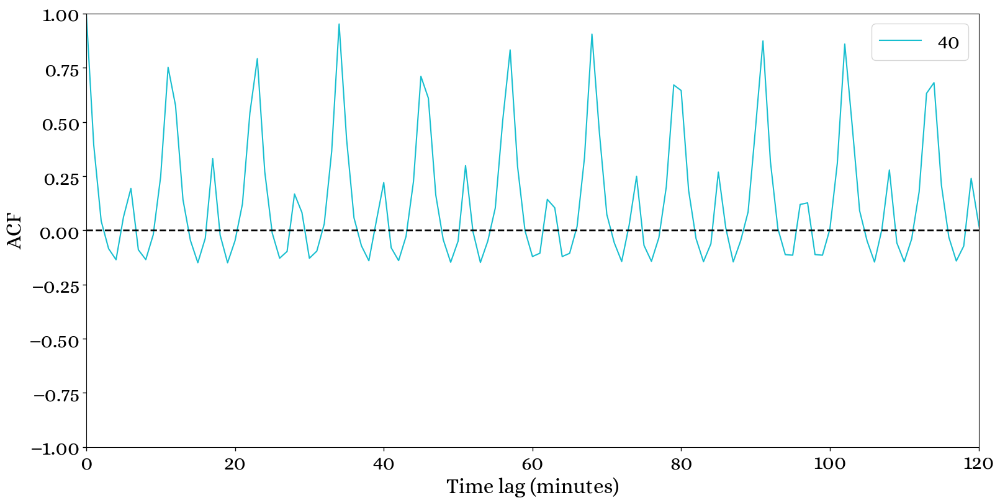

In [655]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

ax.plot(sm.tsa.acf(sin(ds20,1)[:-1],nlags=len(ds20.time)),c=c,label=var)
ax.axhline(0,ls='--',lw=2,c='k')
ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1),xlim=(0,120))
ax.legend()

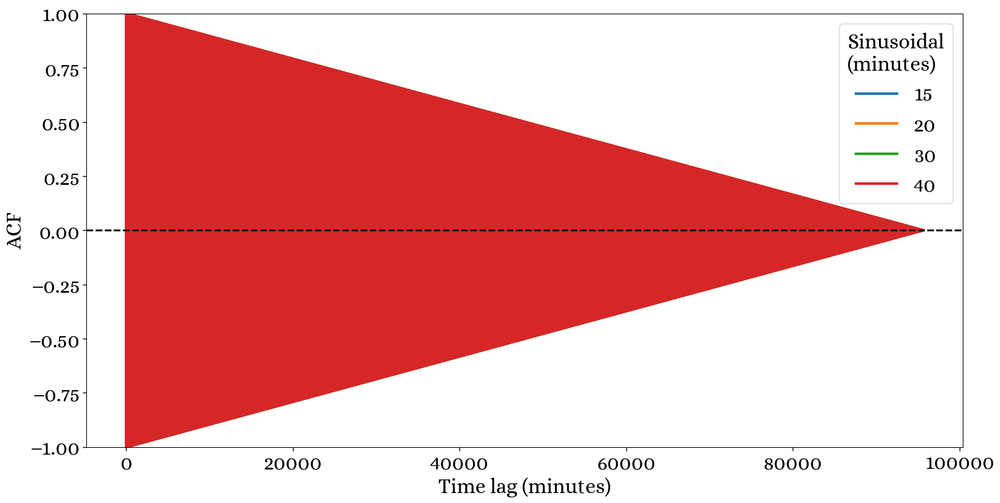

In [640]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

variables = np.array([15,20,30,40])
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i=0
for var,c in zip(variables,colors):
    ax.plot(sm.tsa.acf(sin(ds20,var),nlags=len(ds.time)),c=c,label=var,lw=3)
    ax.axhline(0,ls='--',lw=2,c='k')
    ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1))#,xlim=(0,60))
ax.legend(title='Sinusoidal\n(minutes)')

In [ ]:
red_noise
sin_with_red_noise

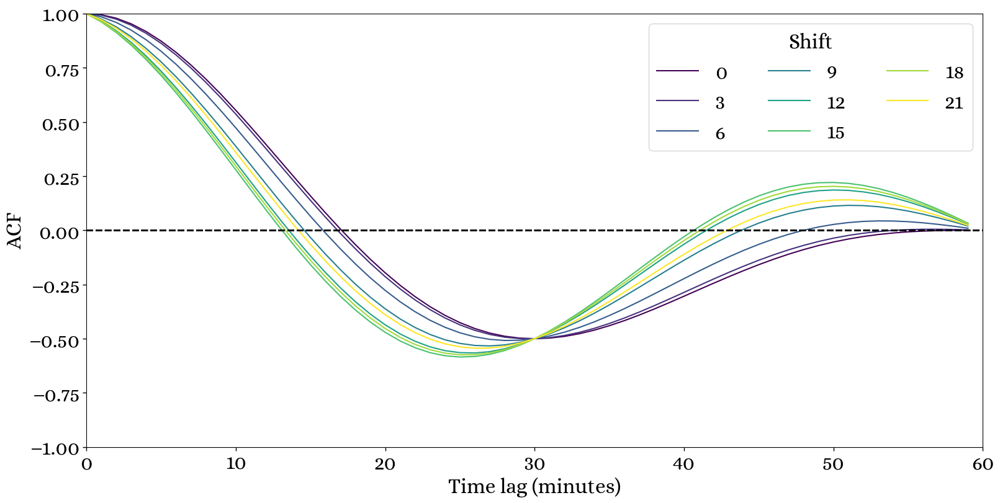

In [623]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

variables = np.array([15,20,30,40])
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors = [plt.get_cmap('viridis',8)(i) for i in range(8)]

for i,c in zip(np.arange(0,60,3),colors):
    ax.plot(sm.tsa.acf(sin(ds20,60)[i:60+i],nlags=60),c=c[:3],label=i)
    ax.axhline(0,ls='--',lw=2,c='k')
    ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1),xlim=(0,60))
ax.legend(ncols=3,loc='upper right',title='Shift')

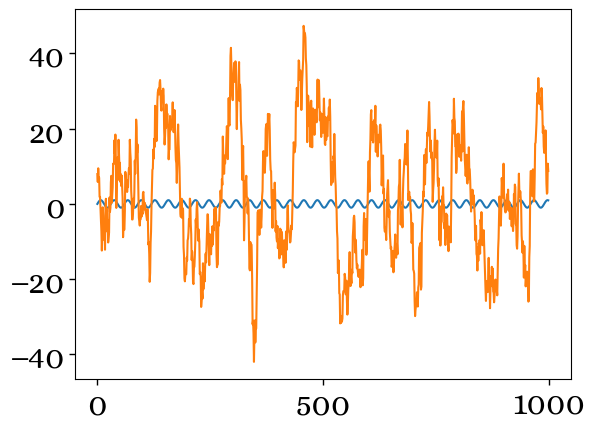

In [681]:
plt.plot(sin(ds20,30)[:1000])
plt.plot(sin_with_red_noise(ds20,30,red_noise_amplitude=100)[:1000])

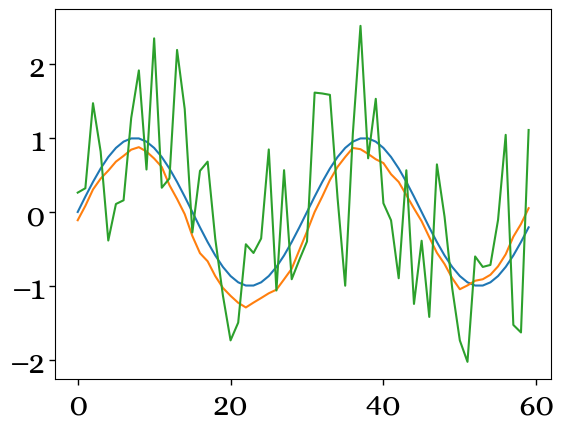

In [712]:
n=60
plt.plot(sin(ds20,30)[:60])
plt.plot(sin_with_red_noise(ds20,30,red_noise_amplitude=1)[:60])
plt.plot(sin_with_white_noise(ds20,30,white_noise_amplitude=1)[:60])

In [120]:
def white_noise(ds, amplitude=0.1):
    # Generate white noise with the same length as the sinusoidal variable
    white_noise = amplitude * np.random.randn(len(ds.time))
    return white_noise

def sin_with_white_noise(ds, n, white_noise_amplitude=0.1):
    # Generate the sinusoidal variable
    sinusoidal_variable = sin(ds, n)

    # Generate white noise
    noise = white_noise(ds, amplitude=white_noise_amplitude)

    # Add white noise to the sinusoidal signal
    signal_with_noise = sinusoidal_variable + noise

    return signal_with_noise

In [118]:
np.mean(hourly,axis=0)

array([ 1.00000000e+00,  3.16288623e-01,  3.10007413e-01,  3.04804924e-01,
        2.92822049e-01,  2.75134689e-01,  2.59123857e-01,  2.43692553e-01,
        2.20543681e-01,  1.93241719e-01,  1.74560087e-01,  1.50510110e-01,
        1.19200167e-01,  9.45570402e-02,  6.82296708e-02,  4.47926590e-02,
        1.97251787e-02, -4.59096379e-03, -3.09056909e-02, -5.21683807e-02,
       -7.46200209e-02, -8.91536959e-02, -1.09862609e-01, -1.19557404e-01,
       -1.36952663e-01, -1.46048207e-01, -1.54065936e-01, -1.59654547e-01,
       -1.66293494e-01, -1.70217563e-01, -1.67874448e-01, -1.69247034e-01,
       -1.68006006e-01, -1.59330165e-01, -1.57062377e-01, -1.49208498e-01,
       -1.41689387e-01, -1.31951069e-01, -1.24657838e-01, -1.13612435e-01,
       -1.04542295e-01, -9.21367019e-02, -8.59290852e-02, -7.41698803e-02,
       -6.57182490e-02, -5.50655290e-02, -4.69084162e-02, -4.06647710e-02,
       -3.26864929e-02, -2.59246698e-02, -1.93082549e-02, -1.68999328e-02,
       -1.12538326e-02, -

In [157]:
ds20_1hr = ds20["SOG"].reset_coords().resample(time="1H").mean('time')

gsw.distance(ds20_1hr.longitude,ds20_1hr.latitude)

array([ 8193.65117851, 10739.24476439, 12161.51278286, ...,
        3962.4808345 ,  4331.58892516,  3757.92669003])

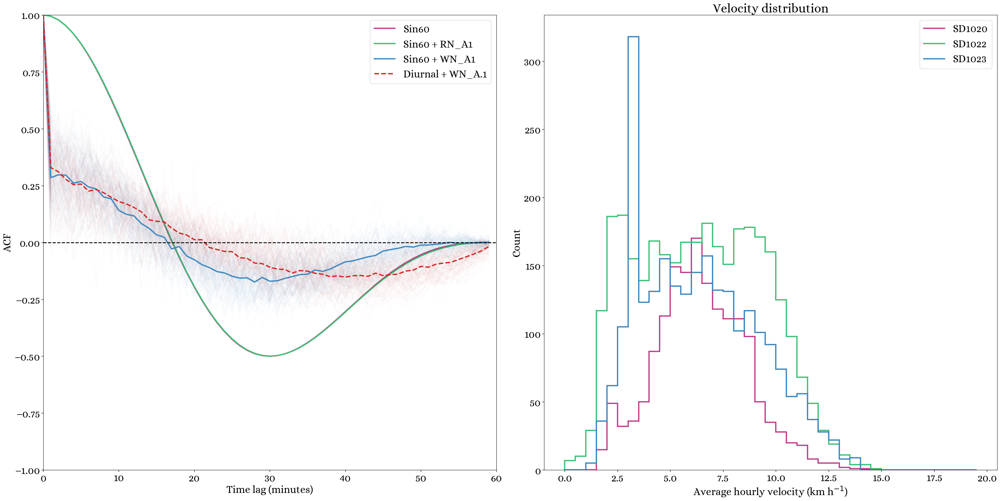

In [155]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(16*2,8*2),constrained_layout=True)

ax.plot(sm.tsa.acf(sin(ds20,60)[:60],nlags=60),c=c20,label="Sin60",lw=3)
ax.plot(sm.tsa.acf(sin_with_red_noise(ds20,60,red_noise_amplitude=1)[:60],nlags=60),c=c22,alpha=1,label="Sin60 + RN_A1",lw=3,ls="-")

hourly=[]
daily=[]

for i in range(100):
    
    hourly.append(sm.tsa.acf(sin_with_white_noise(ds20,60,white_noise_amplitude=1)[:60],nlags=60))
    ax.plot(sm.tsa.acf(sin_with_white_noise(ds20,60,white_noise_amplitude=1)[:60],nlags=60),c=c23,lw=3,alpha=0.01)
    
    daily.append(sm.tsa.acf(sin_with_white_noise(ds20,1440,white_noise_amplitude=0.1)[:60],nlags=60))
    ax.plot(sm.tsa.acf(sin_with_white_noise(ds20,1440,white_noise_amplitude=0.1)[:60],nlags=60),c="C3",lw=3,alpha=0.01)

    
ax.plot(np.mean(hourly,axis=0),c=c23,alpha=1,label="Sin60 + WN_A1",lw=3)

ax.plot(np.mean(daily,axis=0),c="C3",alpha=1,label="Diurnal + WN_A.1",lw=3,ls='--')
    #ax.plot(sm.tsa.acf(white_noise(ds20, amplitude=.1)[:60],nlags=60),c=c23,alpha=1,label="WN_A10",ls='--',lw=3)

ax.axhline(0,ls='--',lw=2,c='k')
ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1),xlim=(0,60))
ax.legend()

ax=bx

_=(ds20["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c20,lw=3)
_=(ds22["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c22,lw=3)
_=(ds23["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c23,lw=3)

ax.legend(handles=legend_handles, loc='upper right',ncols=1)

ax.set(title="Velocity distribution",
       xlabel="Average hourly velocity (km h$^{-1}$)",
       ylabel="Count")

plt.show()

In [159]:
ds20_1hr = ds20["SOG"].reset_coords().resample(time="1H").mean('time')
ds22_1hr = ds22["SOG"].reset_coords().resample(time="1H").mean('time')
ds23_1hr = ds23["SOG"].reset_coords().resample(time="1H").mean('time')

In [161]:
ds23_1hr

<xarray.Dataset>
Dimensions:     (time: 2568)
Coordinates:
  * time        (time) datetime64[ns] 2019-05-10 ... 2019-08-24T23:00:00
Data variables:
    latitude    (time) float64 -46.7 -46.73 -46.76 -46.8 ... nan nan nan nan
    longitude   (time) float64 168.3 168.3 168.3 168.3 168.3 ... nan nan nan nan
    trajectory  (time) float32 1.023e+03 1.023e+03 ... 1.023e+03 1.023e+03
    SOG         (time) float64 0.8522 0.825 1.161 1.502 ... nan nan nan nan

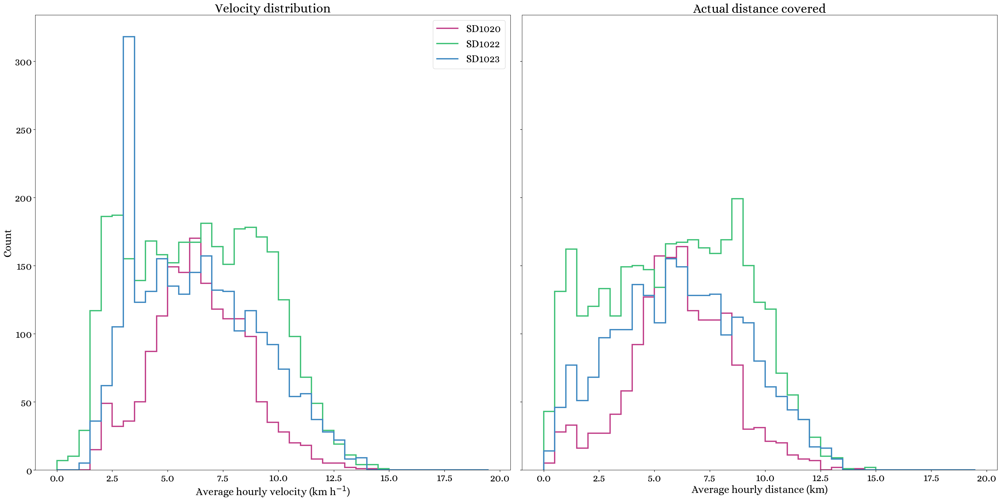

In [167]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(16*2,8*2),constrained_layout=True,sharey=True)

_=(ds20_1hr["SOG"]*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c20,lw=3)
_=(ds22_1hr["SOG"]*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c22,lw=3)
_=(ds23_1hr["SOG"]*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c23,lw=3)

ax.legend(handles=legend_handles, loc='upper right',ncols=1)

ax.set(title="Velocity distribution",
       xlabel="Average hourly velocity (km h$^{-1}$)",
       ylabel="Count")

ax=bx

ax.hist(gsw.distance(ds20_1hr.longitude,ds20_1hr.latitude)/1000,bins=np.arange(0,20,0.5),histtype="step",ec=c20,lw=3)
ax.hist(gsw.distance(ds22_1hr.longitude,ds22_1hr.latitude)/1000,bins=np.arange(0,20,0.5),histtype="step",ec=c22,lw=3)
ax.hist(gsw.distance(ds23_1hr.longitude,ds23_1hr.latitude)/1000,bins=np.arange(0,20,0.5),histtype="step",ec=c23,lw=3)

ax.set(title="Actual distance covered",
       xlabel="Average hourly distance (km)",
       ylabel="")


plt.show()

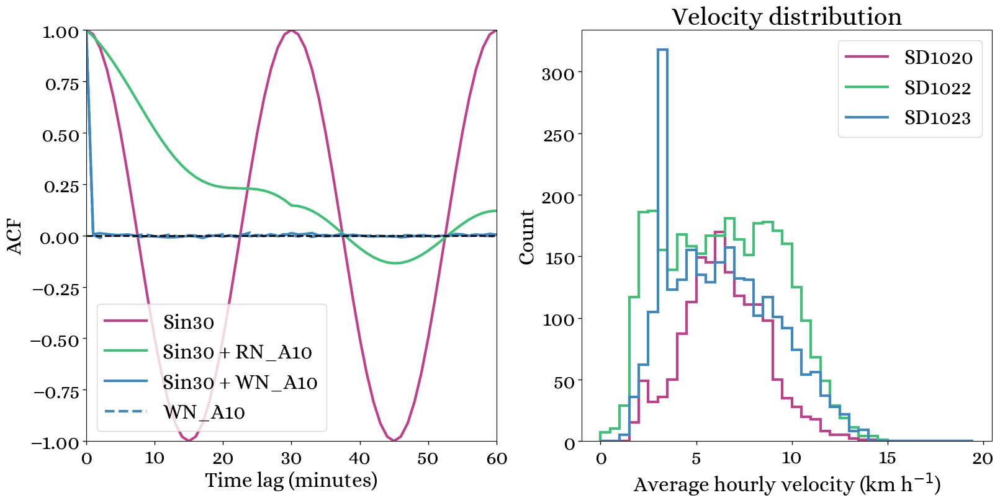

In [153]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(16,8),constrained_layout=True)

ax.plot(sm.tsa.acf(sin(ds20,30)[:-1],nlags=60),c=c20,label="Sin30",lw=3)
ax.plot(sm.tsa.acf(sin_with_red_noise(ds20,30,red_noise_amplitude=10)[:-1],nlags=60),c=c22,alpha=1,label="Sin30 + RN_A10",lw=3)
ax.plot(sm.tsa.acf(sin_with_white_noise(ds20,30,white_noise_amplitude=10)[:-1],nlags=60),c=c23,alpha=1,label="Sin30 + WN_A10",lw=3)
ax.plot(sm.tsa.acf(white_noise(ds20, amplitude=10)[:-1],nlags=60),c=c23,alpha=1,label="WN_A10",ls='--',lw=3)

ax.axhline(0,ls='--',lw=2,c='k')
ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1),xlim=(0,60))
ax.legend()

ax=bx

_=(ds20["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c20,lw=3)
_=(ds22["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c22,lw=3)
_=(ds23["SOG"].resample(time="1H").mean('time')*3.6).plot.hist(bins=np.arange(0,20,0.5),ax=ax,histtype="step",ec=c23,lw=3)

ax.legend(handles=legend_handles, loc='upper right',ncols=1)

ax.set(title="Velocity distribution",
       xlabel="Average hourly velocity (km h$^{-1}$)",
       ylabel="Count")

plt.show()

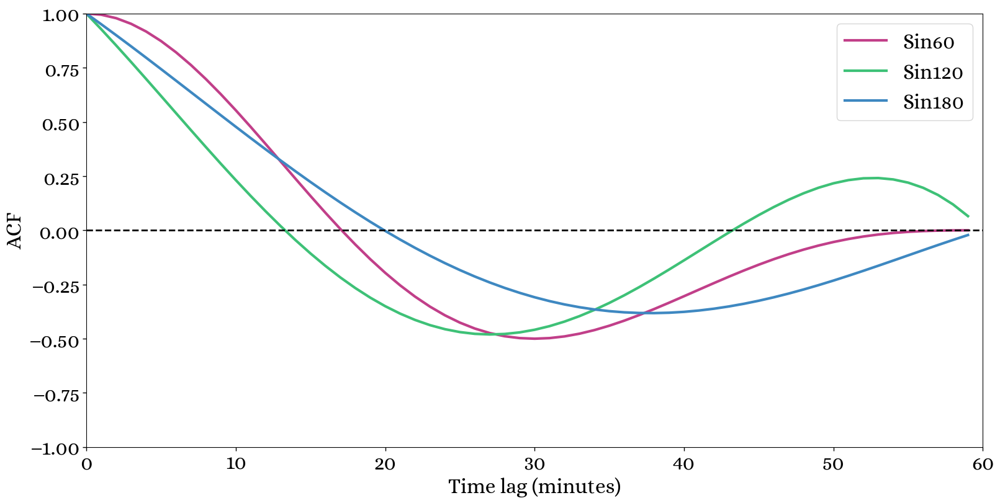

In [745]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

ax.plot(sm.tsa.acf(sin(ds20,60)[:60],nlags=60),c=c20,label="Sin60",lw=3)
ax.plot(sm.tsa.acf(sin(ds20,120)[:60],nlags=60),c=c22,label="Sin120",lw=3)
ax.plot(sm.tsa.acf(sin(ds20,180)[:60],nlags=60),c=c23,label="Sin180",lw=3)
# ax.plot(sm.tsa.acf(sin_with_red_noise(ds20,180,red_noise_amplitude=10)[:60],nlags=60),c=c22,alpha=1,label="Sin30 + RN_A10")
# ax.plot(sm.tsa.acf(sin_with_white_noise(ds20,180,white_noise_amplitude=10)[:60],nlags=60),c=c23,alpha=1,label="Sin30 + WN_A10")
# ax.plot(sm.tsa.acf(white_noise(ds20, amplitude=10)[:60],nlags=60),c=c23,alpha=1,label="WN_A10",ls='--')

ax.axhline(0,ls='--',lw=2,c='k')
ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1),xlim=(0,60))
ax.legend()

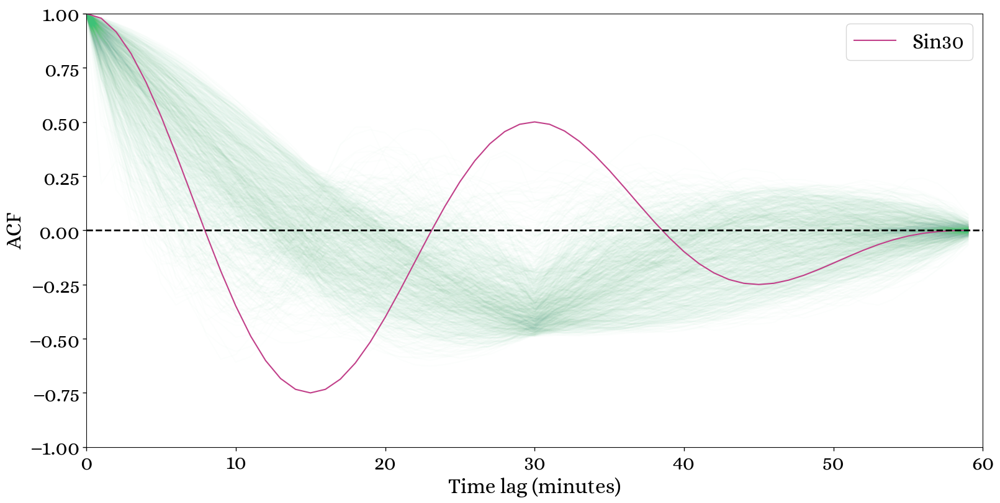

In [722]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

for i in range(1000):
    ax.plot(sm.tsa.acf(sin_with_red_noise(ds20,30,red_noise_amplitude=100)[:60],nlags=60),c=c22,alpha=0.01)
ax.plot(sm.tsa.acf(sin(ds20,30)[:60],nlags=60),c=c20,label="Sin30")
ax.axhline(0,ls='--',lw=2,c='k')
ax.set(ylabel='ACF',xlabel="Time lag (minutes)",ylim=(-1,1),xlim=(0,60))
ax.legend()

In [52]:
# Find the indices of the first occurrence of each crossing
wind20_fc = np.array(np.argmax(np.diff(np.signbit(acf20[0][:-1]), axis=1), axis=1) + 1)
airt20_fc = np.array(np.argmax(np.diff(np.signbit(acf20[1][:-1]), axis=1), axis=1) + 1)
rhum20_fc = np.array(np.argmax(np.diff(np.signbit(acf20[2][:-1]), axis=1), axis=1) + 1)
sst20_fc = np.array(np.argmax(np.diff(np.signbit(acf20[3][:-1]), axis=1), axis=1) + 1)
sss20_fc = np.array(np.argmax(np.diff(np.signbit(acf20[4][:-1]), axis=1), axis=1) + 1)

# Find the indices of the first occurrence of each crossing
wind22_fc = np.array(np.argmax(np.diff(np.signbit(acf22[0][:-1]), axis=1), axis=1) + 1)
airt22_fc = np.array(np.argmax(np.diff(np.signbit(acf22[1][:-1]), axis=1), axis=1) + 1)
rhum22_fc = np.array(np.argmax(np.diff(np.signbit(acf22[2][:-1]), axis=1), axis=1) + 1)
sst22_fc = np.array(np.argmax(np.diff(np.signbit(acf22[3][:-1]), axis=1), axis=1) + 1)
sss22_fc = np.array(np.argmax(np.diff(np.signbit(acf22[4][:-1]), axis=1), axis=1) + 1)

# Find the indices of the first occurrence of each crossing
wind23_fc = np.array(np.argmax(np.diff(np.signbit(acf23[0][:-1]), axis=1), axis=1) + 1)
airt23_fc = np.array(np.argmax(np.diff(np.signbit(acf23[1][:-1]), axis=1), axis=1) + 1)
rhum23_fc = np.array(np.argmax(np.diff(np.signbit(acf23[2][:-1]), axis=1), axis=1) + 1)
sst23_fc = np.array(np.argmax(np.diff(np.signbit(acf23[3][:-1]), axis=1), axis=1) + 1)
sss23_fc = np.array(np.argmax(np.diff(np.signbit(acf23[4][:-1]), axis=1), axis=1) + 1)

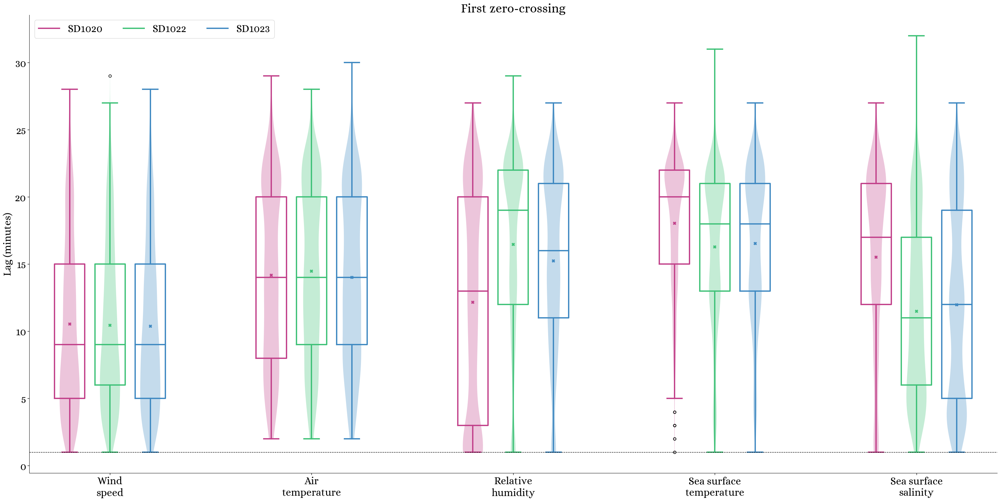

In [333]:
fig,ax = plt.subplots(figsize=(32,16),constrained_layout=True)

v20=ax.violinplot([wind20_fc,airt20_fc,rhum20_fc,sst20_fc,sss20_fc],positions=[0,5,10,15,20],showextrema=False)
v22=ax.violinplot([wind22_fc,airt22_fc,rhum22_fc,sst22_fc,sss22_fc],positions=[0+1,5+1,10+1,15+1,20+1],showextrema=False)
v23=ax.violinplot([wind23_fc,airt23_fc,rhum23_fc,sst23_fc,sss23_fc],positions=[0+2,5+2,10+2,15+2,20+2],showextrema=False)

# Set the color of the violin patches
for v, c in zip([v20,v22,v23], [c20,c22,c23]):
    for b in v['bodies']:
        b.set_facecolor(c)


_=ax.boxplot([wind20_fc,airt20_fc,rhum20_fc,sst20_fc,sss20_fc],
             positions=[0,5,10,15,20],
             medianprops={'lw':3,'c':c20},
             whiskerprops={'lw':3,'c':c20},
             flierprops={'lw':3,'c':c20},
             capprops={'lw':3,'c':c20},
             boxprops={'lw':3,'c':c20},
             widths=0.75,
             showmeans=True,
             meanprops={'marker':'x','mec':c20,'mew':3})

_=ax.boxplot([wind22_fc,airt22_fc,rhum22_fc,sst22_fc,sss22_fc],
             positions=[0+1,5+1,10+1,15+1,20+1],
             medianprops={'lw':3,'c':c22},
             whiskerprops={'lw':3,'c':c22},
             flierprops={'lw':3,'c':c22},
             capprops={'lw':3,'c':c22},
             boxprops={'lw':3,'c':c22},widths=0.75,
             showmeans=True,
             meanprops={'marker':'x','mec':c22,'mew':3})

_=ax.boxplot([wind23_fc,airt23_fc,rhum23_fc,sst23_fc,sss23_fc],
             positions=[0+2,5+2,10+2,15+2,20+2],
             medianprops={'lw':3,'c':c23},
             whiskerprops={'lw':3,'c':c23},
             flierprops={'lw':3,'c':c23},
             capprops={'lw':3,'c':c23},
             boxprops={'lw':3,'c':c23},widths=0.75,
             showmeans=True,
             meanprops={'marker':'x','mec':c23,'mew':3})

ax.axhline(1,lw=1,ls='--',c='k')
ax.legend(handles=legend_handles, loc='upper left',ncols=3)
ax.set(xlim=(-1,23),
       xticks=[1,6,11,16,21],
       xticklabels=['Wind\nspeed','Air\ntemperature','Relative\nhumidity','Sea surface\ntemperature','Sea surface\nsalinity'],
       #ylim=(-0.5,35),
       ylabel="Lag (minutes)", 
       title="First zero-crossing")


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

In [26]:
np.array(np.argmax(np.diff(np.signbit(acf20[0][:-1]), axis=1), axis=1) + 1)

array([19,  5,  5, ..., 21, 11, 13])

In [27]:
ds20

<xarray.Dataset>
Dimensions:                         (time: 95630)
Coordinates:
  * time                            (time) datetime64[ns] 2019-01-19T04:00:00...
    latitude                        (time) float64 ...
    longitude                       (time) float64 ...
    trajectory                      float32 1.02e+03
Data variables: (12/58)
    SOG                             (time) float64 1.762 1.361 ... 0.958 1.602
    COG                             (time) float64 119.8 118.8 ... 38.1 102.8
    HDG                             (time) float64 108.2 104.8 ... 68.3 81.5
    HDG_WING                        (time) float64 107.1 103.7 ... 66.5 79.6
    WING_ANGLE                      (time) float64 -1.1 -1.1 0.0 ... -1.7 -2.0
    UWND_MEAN                       (time) float64 13.7 13.86 ... 5.48 5.31
    ...                              ...
    sin05                           (time) float64 0.0 0.9511 ... -0.9511
    sin09                           (time) float64 0.0 0.6428 ... 0.866 0.342
    sin10                           (time) float64 0.0 0.5878 ... -0.5878
    sin11                           (time) float64 0.0 0.5406 ... 0.2817 -0.2817
    sin20                           (time) float64 0.0 0.309 ... 0.5878 0.309
    sin60                           (time) float64 0.0 0.1045 ... -0.9135
Attributes: (12/38)
    title:                     Antarctica Circumnavigation Surface Data
    summary:                   This data set was collected from the first Sai...
    ncei_template_version:     NCEI_NetCDF_Trajectory_Template_v2.0
    Conventions:               CF-1.6, ACDD-1.3
    netcdf_version:            4.6.3
    featureType:               trajectory
    ...                        ...
    geospatial_lat_min:        -60.9862208
    geospatial_lat_max:        -46.4277568
    geospatial_lat_units:      degrees_north
    geospatial_lon_min:        -179.9986816
    geospatial_lon_max:        179.9997312
    geospatial_lon_units:      degrees_east

1593.8333333333333

In [29]:
len(acf20[0][:-1])

1592

In [34]:
i=0
ds20["wind_speed"][60*i:60*(i+1) + 1].values

array([14.35001394, 14.43728783, 14.52992016, 14.62780913, 14.73084994,
       14.83893527, 14.73279906, 14.63168999, 14.53571299, 14.44497034,
       14.35956127, 14.29764428, 14.24909288, 14.21404404, 14.19259779,
       14.18481583, 14.0012138 , 13.82250021, 13.64886706, 13.48051067,
       13.31763117, 13.56163958, 13.80568187, 14.0497563 , 14.2938612 ,
       14.53799505, 14.35823499, 14.17863703, 13.99920741, 13.81995268,
       13.64087974, 13.88260163, 14.12616126, 14.3714652 , 14.61842563,
       14.86696001, 14.9907797 , 15.11461028, 15.2384515 , 15.36230308,
       15.48616479, 15.53714517, 15.59152141, 15.64925813, 15.71031827,
       15.77466323, 15.85601261, 15.93775091, 16.01987216, 16.10237051,
       16.18524019, 16.5172861 , 16.84933708, 17.18139284, 17.51345311,
       17.84551764, 17.39035882, 16.93773598, 16.48785796, 16.04095571,
       15.59728502])

In [33]:
len(acf20[0][:-1][i])

61

In [38]:
np.sum(acf20[0][:-1][i][:wind20_fc[i]])

6.430870249006222

In [35]:
for i in tqdm(range(len(acf20[0][:-1]))):
    
    fig,(ax,bx) = plt.subplots(1,2,figsize=(16,8),constrained_layout=True)
    
    ax.plot(acf20[0][:-1][i],zorder=1)
    ax.scatter(wind20_fc[i],acf20[0][:-1][i][wind20_fc[i]],c='r',zorder=2)
    ax.set(ylim=(-0.5,1),xlim=(0,61),xlabel="Lag (minutes)", ylabel="Autocovariance")
    
    bx.plot(ds20["wind_speed"][60*i:60*(i+1) + 1].values)
    bx.set(ylim=(-0.5,25),xlim=(0,61),xlabel="Lag (minutes)", ylabel="Wind speed (m s$^{-1}$)")
    
    plt.savefig(f"../figures/acf_{str(i).zfill(4)}.png")
    plt.close()

  0%|          | 0/1592 [00:00<?, ?it/s]

In [71]:
for i in tqdm(range(len(acf20[0][:-1]))):
    
    fig,(ax,bx) = plt.subplots(1,2,figsize=(16,8),constrained_layout=True)
    
    ax.plot(acf20[1][:-1][i],zorder=1)
    ax.scatter(airt20_fc[i],acf20[1][:-1][i][airt20_fc[i]],c='r',zorder=2)
    ax.set(ylim=(-0.5,1),xlim=(0,61),xlabel="Lag (minutes)", ylabel="Autocovariance")
    
    bx.plot(ds20["TEMP_AIR_MEAN"][60*i:60*(i+1) + 1].values)
    bx.set(ylim=(-0.5,17.5),xlim=(0,61),xlabel="Lag (minutes)", ylabel="Air temperature (°C)")
    
    plt.savefig(f"../figures/acf_airt_{str(i).zfill(4)}.png")
    plt.close()

  0%|          | 0/1592 [00:00<?, ?it/s]

In [53]:
def calculate_integrals(acf20, wind20_fc, airt20_fc, rhum20_fc, sst20_fc, sss20_fc):
    wind_integral = np.zeros(len(acf20[0][:-1]))
    airt_integral = np.zeros(len(acf20[0][:-1]))
    rhum_integral = np.zeros(len(acf20[0][:-1]))
    sst_integral = np.zeros(len(acf20[0][:-1]))
    sss_integral = np.zeros(len(acf20[0][:-1]))

    for i in tqdm(range(len(acf20[0][:-1]))):
        wind_integral[i] = np.sum(acf20[0][:-1][i][:wind20_fc[i]]) 
        airt_integral[i] = np.sum(acf20[1][:-1][i][:airt20_fc[i]]) 
        rhum_integral[i] = np.sum(acf20[2][:-1][i][:rhum20_fc[i]]) 
        sst_integral[i] = np.sum(acf20[3][:-1][i][:sst20_fc[i]]) 
        sss_integral[i] = np.sum(acf20[4][:-1][i][:sss20_fc[i]]) 

    return wind_integral, airt_integral, rhum_integral, sst_integral, sss_integral

# Usage:
wind20_integral, airt20_integral, rhum20_integral, sst20_integral, sss20_integral = calculate_integrals(acf20, wind20_fc, airt20_fc, rhum20_fc, sst20_fc, sss20_fc)
wind22_integral, airt22_integral, rhum22_integral, sst22_integral, sss22_integral = calculate_integrals(acf22, wind22_fc, airt22_fc, rhum22_fc, sst22_fc, sss22_fc)
wind23_integral, airt23_integral, rhum23_integral, sst23_integral, sss23_integral = calculate_integrals(acf23, wind23_fc, airt23_fc, rhum23_fc, sst23_fc, sss23_fc)

  0%|          | 0/1592 [00:00<?, ?it/s]

  0%|          | 0/2286 [00:00<?, ?it/s]

  0%|          | 0/1665 [00:00<?, ?it/s]

In [57]:
def calculate_means(*arrays):
    means = []
    for array in arrays:
        mean = np.nanmean(array)
        means.append(mean)
    return means

wind_mean, airt_mean, rhum_mean, sst_mean, sss_mean = calculate_means(wind23_integral, airt23_integral, rhum23_integral, sst23_integral, sss23_integral)

In [62]:
# For case 20
wind20_mean, airt20_mean, rhum20_mean, sst20_mean, sss20_mean = calculate_means(wind20_integral, airt20_integral, rhum20_integral, sst20_integral, sss20_integral)

print("Mean Wind Integral (SD1020):", wind20_mean*2)
print("Mean Air Temperature Integral (SD1020):", airt20_mean*2)
print("Mean Relative Humidity Integral (SD1020):", rhum20_mean*2)
print("Mean Sea Surface Temperature Integral (SD1020):", sst20_mean*2)
print("Mean Sea Surface Salinity Integral (SD1020):", sss20_mean*2)

# For case 22
wind22_mean, airt22_mean, rhum22_mean, sst22_mean, sss22_mean = calculate_means(wind22_integral, airt22_integral, rhum22_integral, sst22_integral, sss22_integral)

print("\nMean Wind Integral (SD1022):", wind22_mean*2)
print("Mean Air Temperature Integral (SD1022):", airt22_mean*2)
print("Mean Relative Humidity Integral (SD1022):", rhum22_mean*2)
print("Mean Sea Surface Temperature Integral (SD1022):", sst22_mean*2)
print("Mean Sea Surface Salinity Integral (SD1022):", sss22_mean*2)

# For case 23
wind23_mean, airt23_mean, rhum23_mean, sst23_mean, sss23_mean = calculate_means(wind23_integral, airt23_integral, rhum23_integral, sst23_integral, sss23_integral)

print("\nMean Wind Integral (SD1023):", wind23_mean*2)
print("Mean Air Temperature Integral (SD1023):", airt23_mean*2)
print("Mean Relative Humidity Integral (SD1023):", rhum23_mean*2)
print("Mean Sea Surface Temperature Integral (SD1023):", sst23_mean*2)
print("Mean Sea Surface Salinity Integral (SD1023):", sss23_mean*2)

In [66]:
import pandas as pd

# Create a dictionary with the mean values
data = {
    'SD1020': [wind20_mean*2, airt20_mean*2, rhum20_mean*2, sst20_mean*2, sss20_mean*2],
    'SD1022': [wind22_mean*2, airt22_mean*2, rhum22_mean*2, sst22_mean*2, sss22_mean*2],
    'SD1023': [wind23_mean*2, airt23_mean*2, rhum23_mean*2, sst23_mean*2, sss23_mean*2]
}

# Create a DataFrame
df = pd.DataFrame(data, index=['Mean Wind Integral', 'Mean Air Temperature Integral', 'Mean Relative Humidity Integral', 'Mean Sea Surface Temperature Integral', 'Mean Sea Surface Salinity Integral'])

In [67]:
df

,SD1020,SD1022,SD1023
Mean Wind Integral,8.242735,8.411032,8.092785
Mean Air Temperature Integral,12.106820,12.557387,11.972293
Mean Relative Humidity Integral,11.736180,16.218178,15.069354
Mean Sea Surface Temperature Integral,16.907931,15.070755,15.498000
Mean Sea Surface Salinity Integral,13.102200,9.120026,9.892793


In [ ]:
wind_integral = []
airt_integral = []
rhum_integral = []
sst_integral = []
sss_integral = []

for i in tqdm(range(len(acf20[0][:-1]))):
    wind_integral.append(np.sum(acf20[0][:-1][i][:wind20_fc[i]])) 
    airt_integral.append(np.sum(acf20[1][:-1][i][:airt20_fc[i]])) 
    rhum_integral.append(np.sum(acf20[2][:-1][i][:rhum20_fc[i]])) 
    sst_integral.append(np.sum(acf20[3][:-1][i][:sst20_fc[i]])) 
    sss_integral.append(np.sum(acf20[4][:-1][i][:sss20_fc[i]])) 
    
wind_integral = np.asarray(wind_integral)
airt_integral = np.asarray(airt_integral)
rhum_integral = np.asarray(rhum_integral)
sst_integral = np.asarray(sst_integral)
sss_integral = np.asarray(sss_integral)


In [68]:
def calc_distance_for_acv(ds, tw, start_time, end_time):
    """
    Function to calculate and plot autocorrelation values.

    Parameters:
        ds (xarray.Dataset): The dataset containing the variable data.
        tw (int): The time window size for autocorrelation calculation.
        start_time (str): Start time for data extraction (format: 'YYYY-MM-DD').
        end_time (str): End time for data extraction (format: 'YYYY-MM-DD').

    Returns:
        list: List of autocorrelation values calculated.
    """

    dists = []
    ds = ds.isel(time=slice(start_time, end_time)).interpolate_na('time')
    # Calculate autocorrelations
    for i in tqdm(range(int(len(ds.time) / tw)),"Calculating distances"):
        dist = np.cumsum(np.insert(gsw.distance(ds["longitude"].interpolate_na('time').values[tw*i: tw*(i+1) + 1],
                            ds["latitude"].interpolate_na('time').values[tw*i: tw*(i+1) + 1]),0,0))
         # Append autocorrelation values to the list
        dists.append(dist)

    return dists


In [69]:
dists20 = calc_distance_for_acv(ds20, 60, 0, 95630)
dists22 = calc_distance_for_acv(ds22, 60, 0, 137287)
dists23 = calc_distance_for_acv(ds23, 60, 0, 100000)

Calculating distances:   0%|          | 0/1593 [00:00<?, ?it/s]

Calculating distances:   0%|          | 0/2288 [00:00<?, ?it/s]

Calculating distances:   0%|          | 0/1666 [00:00<?, ?it/s]

In [ ]:
# Define a custom formatter function
def km_formatter(x, pos):
    return f'{x / 1000:.0f} km'

In [70]:
wind_dist20 = []
airt_dist20 = []
rhum_dist20 = []
sst_dist20 = []
sss_dist20 = []

for i in range(len(wind20_fc)):
    wind_dist20.append(dists20[i][int(wind20_fc[i])])
    airt_dist20.append(dists20[i][int(airt20_fc[i])])
    rhum_dist20.append(dists20[i][int(rhum20_fc[i])])
    sst_dist20.append(dists20[i][int(sst20_fc[i])])
    sss_dist20.append(dists20[i][int(sss20_fc[i])])
    
wind_dist22 = []
airt_dist22 = []
rhum_dist22 = []
sst_dist22 = []
sss_dist22 = []

for i in range(len(wind22_fc)):
    wind_dist22.append(dists22[i][int(wind22_fc[i])])
    airt_dist22.append(dists22[i][int(airt22_fc[i])])
    rhum_dist22.append(dists22[i][int(rhum22_fc[i])])
    sst_dist22.append(dists22[i][int(sst22_fc[i])])
    sss_dist22.append(dists22[i][int(sss22_fc[i])])
    

wind_dist23 = []
airt_dist23 = []
rhum_dist23 = []
sst_dist23 = []
sss_dist23 = []

for i in range(len(wind23_fc)):
    wind_dist23.append(dists23[i][int(wind23_fc[i])])
    airt_dist23.append(dists23[i][int(airt23_fc[i])])
    rhum_dist23.append(dists23[i][int(rhum23_fc[i])])
    sst_dist23.append(dists23[i][int(sst23_fc[i])])
    sss_dist23.append(dists23[i][int(sss23_fc[i])])

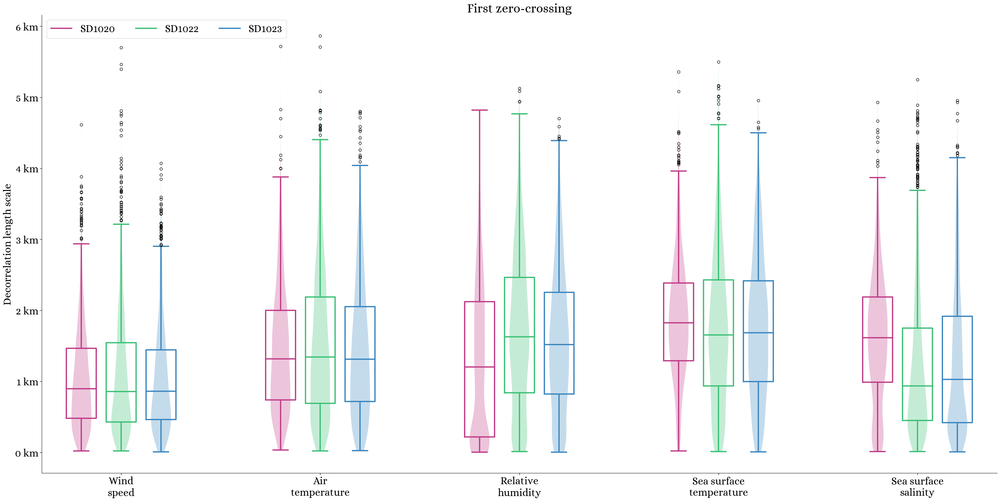

In [83]:
fig,ax = plt.subplots(figsize=(32,16),constrained_layout=True)

v20=ax.violinplot([wind_dist20,airt_dist20,rhum_dist20,sst_dist20,sss_dist20],positions=[0,5,10,15,20],showextrema=False)
v22=ax.violinplot([wind_dist22,airt_dist22,rhum_dist22,sst_dist22,sss_dist22],positions=[0+1,5+1,10+1,15+1,20+1],showextrema=False)
v23=ax.violinplot([wind_dist23,airt_dist23,rhum_dist23,sst_dist23,sss_dist23],positions=[0+2,5+2,10+2,15+2,20+2],showextrema=False)

# Set the color of the violin patches
for v, c in zip([v20,v22,v23], [c20,c22,c23]):
    for b in v['bodies']:
        b.set_facecolor(c)


_=ax.boxplot([wind_dist20,airt_dist20,rhum_dist20,sst_dist20,sss_dist20],
             positions=[0,5,10,15,20],
             medianprops={'lw':3,'c':c20},
             whiskerprops={'lw':3,'c':c20},
             flierprops={'lw':3,'c':c20},
             capprops={'lw':3,'c':c20},
             boxprops={'lw':3,'c':c20},widths=0.75)

_=ax.boxplot([wind_dist22,airt_dist22,rhum_dist22,sst_dist22,sss_dist22],
             positions=[0+1,5+1,10+1,15+1,20+1],
             medianprops={'lw':3,'c':c22},
             whiskerprops={'lw':3,'c':c22},
             flierprops={'lw':3,'c':c22},
             capprops={'lw':3,'c':c22},
             boxprops={'lw':3,'c':c22},widths=0.75)

_=ax.boxplot([wind_dist23,airt_dist23,rhum_dist23,sst_dist23,sss_dist23],
             positions=[0+2,5+2,10+2,15+2,20+2],
             medianprops={'lw':3,'c':c23},
             whiskerprops={'lw':3,'c':c23},
             flierprops={'lw':3,'c':c23},
             capprops={'lw':3,'c':c23},
             boxprops={'lw':3,'c':c23},widths=0.75)

ax.legend(handles=legend_handles, loc='upper left',ncols=3)
ax.set(xlim=(-1,23),
       xticks=[1,6,11,16,21],
       xticklabels=['Wind\nspeed','Air\ntemperature','Relative\nhumidity','Sea surface\ntemperature','Sea surface\nsalinity'],
       ylabel="Decorrelation length scale", 
       title="First zero-crossing")
ax.yaxis.set_major_formatter(FuncFormatter(km_formatter))

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

In [270]:
def plot_violin_and_boxplot(ax,data_list, positions_list, color_list, legend_handles, title):

    violins = []
    boxes = []

    for data, positions, color in zip(data_list, positions_list, color_list):
        v = ax.violinplot(data, positions=positions, showextrema=False)
        violins.append(v)

        for b in v['bodies']:
            b.set_facecolor(color)

        bp = ax.boxplot(data, positions=positions, medianprops={'lw': 3, 'c': color},
                        whiskerprops={'lw': 3, 'c': color}, flierprops={'lw': 3, 'c': color},
                        capprops={'lw': 3, 'c': color}, boxprops={'lw': 3, 'c': color}, widths=0.75,
                        showmeans=True, meanprops={'marker': 'x', 'mec': color, 'mew': 3})
        boxes.append(bp)

    #ax.legend(handles=legend_handles, loc='upper left', ncols=3)
    ax.set(xlim=(-1, max(positions_list[-1]) + 3),
           xticks=[p + 1 for p in positions_list[0]],
           xticklabels=['Wind\nspeed', 'Air\ntemperature', 'Relative\nhumidity',
                        'Sea surface\ntemperature', 'Sea surface\nsalinity'],
           ylabel="Decorrelation length scale",
           title=title)
    ax.yaxis.set_major_formatter(FuncFormatter(km_formatter))

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

In [109]:
def plot_violin_and_boxplot_with_means(ax,data_list, positions_list, color_list, legend_handles, title):

    violins = []
    boxes = []

    for data, positions, color in zip(data_list, positions_list, color_list):
        v = ax.violinplot(data, positions=positions, showextrema=False)
        violins.append(v)

        for b in v['bodies']:
            b.set_facecolor(color)

        bp = ax.boxplot(data, positions=positions, medianprops={'lw': 3, 'c': color},
                        whiskerprops={'lw': 3, 'c': color}, flierprops={'lw': 3, 'c': color},
                        capprops={'lw': 3, 'c': color}, boxprops={'lw': 3, 'c': color}, widths=0.75,
                        showmeans=True, meanprops={'marker': 'x', 'mec': color, 'mew': 3})
        boxes.append(bp)

    ax.axhline(1, lw=1, ls='--', c='k')
    ax.legend(handles=legend_handles, loc='upper left', ncols=3)
    ax.set(xlim=(-1, max(positions_list[-1]) + 3),
           xticks=[p + 1 for p in positions_list[0]],
           xticklabels=['Wind\nspeed', 'Air\ntemperature', 'Relative\nhumidity',
                        'Sea surface\ntemperature', 'Sea surface\nsalinity'],
           # ylim=(-0.5,35),
           ylabel="Lag (minutes)",
           title=title)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

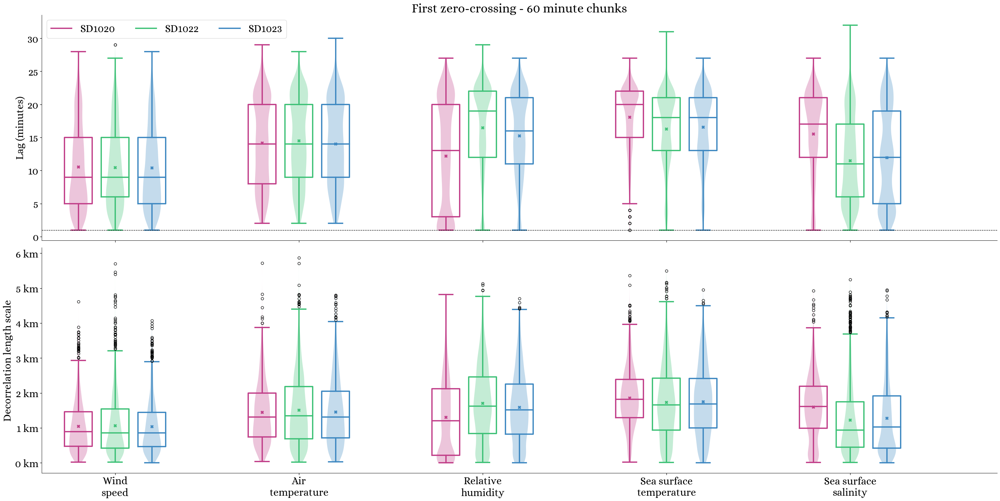

In [334]:
fig, ax = plt.subplots(2, 1, figsize=(32, 16), constrained_layout=True, sharex=True)

plot_violin_and_boxplot_with_means(
    ax[0],
    data_list=[[wind20_fc, airt20_fc, rhum20_fc, sst20_fc, sss20_fc],
               [wind22_fc, airt22_fc, rhum22_fc, sst22_fc, sss22_fc],
               [wind23_fc, airt23_fc, rhum23_fc, sst23_fc, sss23_fc]],
    positions_list=[[0, 5, 10, 15, 20], [1, 6, 11, 16, 21], [2, 7, 12, 17, 22]],
    color_list=[c20, c22, c23],
    legend_handles=legend_handles,
    title="First zero-crossing - 60 minute chunks"
)

plot_violin_and_boxplot(
    ax[1],
    data_list=[[wind_dist20, airt_dist20, rhum_dist20, sst_dist20, sss_dist20],
               [wind_dist22, airt_dist22, rhum_dist22, sst_dist22, sss_dist22],
               [wind_dist23, airt_dist23, rhum_dist23, sst_dist23, sss_dist23]],
    positions_list=[[0, 5, 10, 15, 20], [1, 6, 11, 16, 21], [2, 7, 12, 17, 22]],
    color_list=[c20, c22, c23],
    legend_handles=legend_handles,
    title=""
)

In [53]:
def calc_and_plot_acv_test(ax, ds, var, tw, cmap, start_time, end_time, shift=0):
    """
    Function to calculate and plot autocorrelation values.

    Parameters:
        ax (matplotlib.axes.Axes): The axes object to plot on.
        ds (xarray.Dataset): The dataset containing the variable data.
        var (str): The variable to calculate autocorrelation for.
        tw (int): The time window size for autocorrelation calculation.
        c (str): Color of the plotted lines.
        start_time (str): Start time for data extraction (format: 'YYYY-MM-DD').
        end_time (str): End time for data extraction (format: 'YYYY-MM-DD').
        shift (int, optional): Time shift for autocorrelation calculation. Defaults to 0.

    Returns:
        list: List of autocorrelation values calculated.
    """

    # Extract data for the variable from the dataset
    x = ds[var].isel(time=slice(start_time, end_time)).interpolate_na('time').values

    # Mask NaN values
    msk = np.isfinite(x)
    x = x[msk]
    
    colors = [plt.get_cmap(cmap)(i)[:3] for i in np.linspace(0, 1, int(len(x)/tw))]   
    
    acf = []
    # Calculate autocorrelations
    for i in range(int(len(x) / tw)):
        # Calculate autocorrelation for the current time window
        ac = sm.tsa.acf(x[tw*i + shift: tw*(i+1) + 1 + shift], nlags=tw, missing='conservative')
        # Plot autocorrelation values on the provided axes
        ax.plot(ac, c=colors[i], alpha=0.05, zorder=2)

        # Append autocorrelation values to the list
        acf.append(ac)

    return acf

In [54]:
def plot_acf_panels_c_time(ds,tw,start_time,end_time,c,cmap):
    # Define variables, titles, units, and colors for plotting
    variables = ['wind_speed', 'TEMP_AIR_MEAN', 'RH_MEAN', 'TEMP_CTD_RBR_MEAN', 'SAL_RBR_MEAN']
    titles = ['Wind speed', 'Air temperature', 'Relative humidity', 'Sea surface temperature', 'Sea surface salinity']
    units = ["m s$^{-1}$", "°C", "%", "°C", "PSU"]
    # Create subplots
    fig, ax = plt.subplots(int(len(variables)), 3, constrained_layout=True, figsize=(32, 16), sharex='col')

    # Set time window for autocorrelation calculation
    #tw = 60 * 1

    # Loop through variables to calculate and plot autocorrelation
    acf = []
    for axs, var, t in zip(ax.T[0], variables, titles):
        acf.append(calc_and_plot_acv_test(axs, ds, var, tw, cmap, start_time, end_time, shift=0))
        # Set labels and limits for the subplot
        axs.set(xlabel='Time lag (min)' if "SAL" in var else "", xlim=(-1, tw), ylabel="ACF")
        axs.set_title(t, loc='right', x=0.975, y=0.85, c=c, fontweight='bold')
        axs.axhline(0, ls='--', zorder=1, c='k', lw=1)
        axs.set(ylim=(-0.6, 1.1))

    # Plot mean autocorrelation with standard deviation on the second column of subplots
    for axs, i, l in zip(ax.T[1], range(5), titles):
        axs.plot(np.nanmean(acf[i][:-1], axis=0), label=f"Mean ACF", lw=3, c=c, zorder=2)
        axs.fill_between(np.arange(0, tw+1, 1), np.nanmean(acf[i][:-1], axis=0)-np.nanstd(acf[i][:-1], axis=0),
                         np.nanmean(acf[i][:-1], axis=0)+np.nanstd(acf[i][:-1], axis=0),
                         label=r"$\pm$ 1$\sigma$", lw=3, fc=c, ec='None', alpha=0.2, zorder=2)
        axs.axhline(0, lw=1, ls='--', zorder=1, c='k')
        axs.legend(ncols=2, fontsize='small')
        axs.set(ylim=(-0.6, 1.1), yticklabels=[])

    # Plot actual variable data on the third column of subplots
    variables[-1] = 'sal'
    for axs, var, t, u in zip(ax.T[2], variables, titles, units):
        ds[var].isel(time=slice(start_time, end_time)).rolling(time=3, center=True).median('time').plot(ax=axs, c=c, lw=3)
        axs.set(ylabel=f"({u})", title='', xlabel="")
        # Set specific limits for the last subplot
        ax.T[2][2].set(ylim=(50, 105))

    # Fix x-axis ticks based on the data range
    my_funcs.fix_xticks([axs], ds.isel(time=slice(start_time, end_time)))
    return acf

/Users/xedhjo/opt/miniconda3/envs/env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:681: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/Users/xedhjo/opt/miniconda3/envs/env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:681: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/Users/xedhjo/opt/miniconda3/envs/env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:681: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


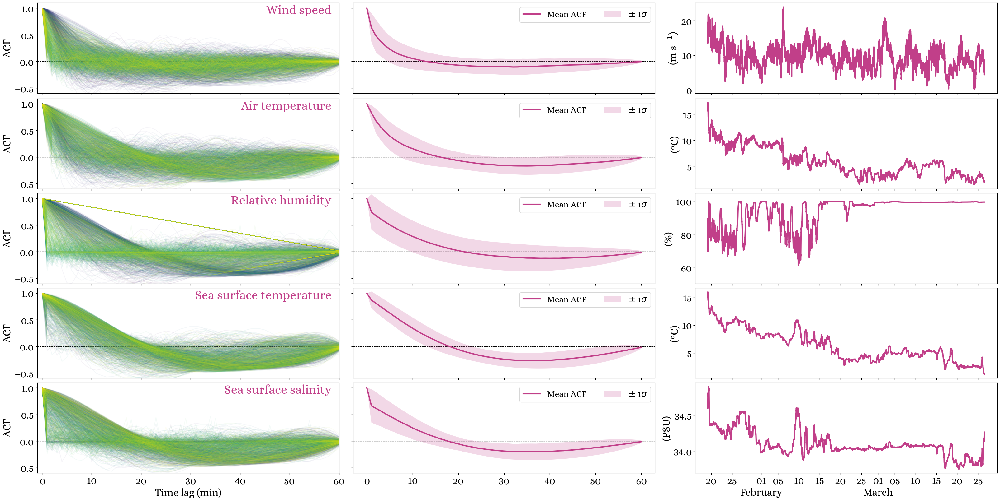

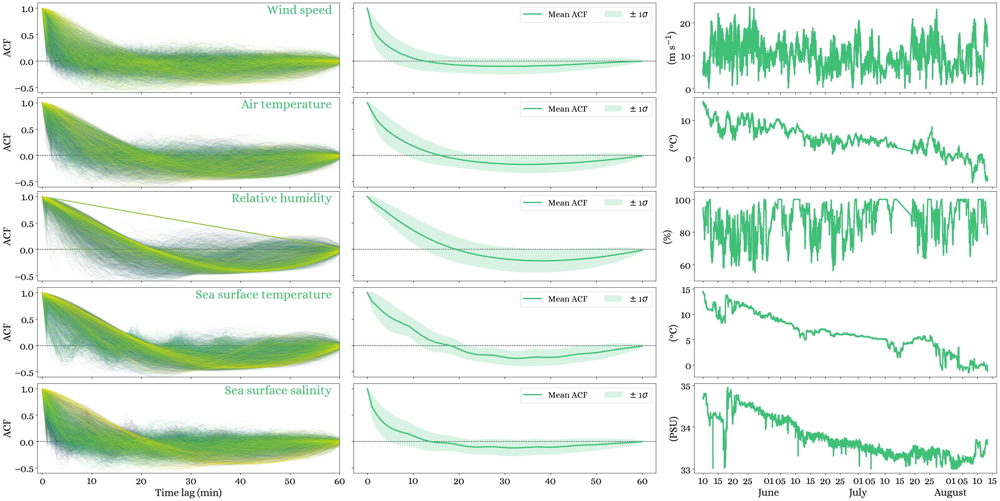

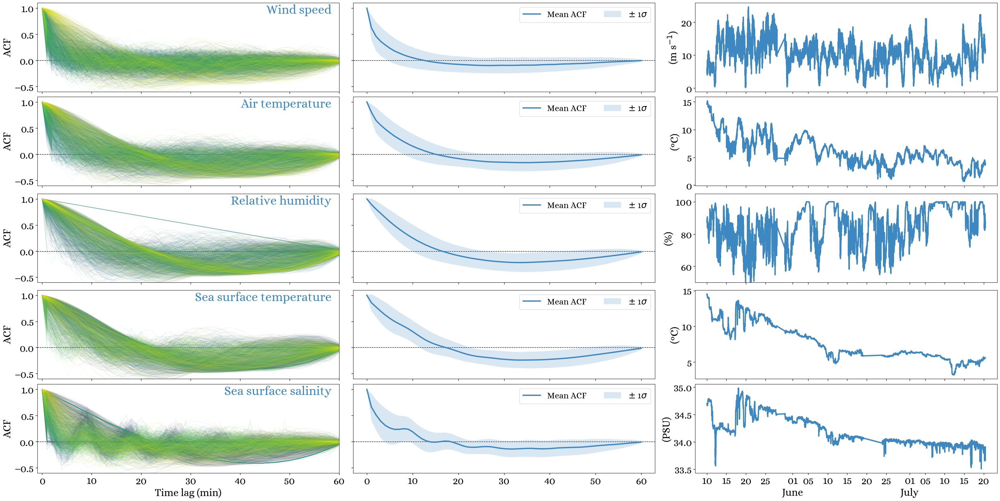

In [55]:
acf20 = plot_acf_panels_c_time(ds20,60,0,95630,c20,"viridis")
acf22 = plot_acf_panels_c_time(ds22,60,0,137287,c22,"viridis")
acf23 = plot_acf_panels_c_time(ds23,60,0,100000,c23,"viridis")

In [437]:
np.integrate?

Object `np.integrate` not found.


In [436]:
np.sum(acf20[0][:-1][3])

0.5000000000000004

In [400]:
def calc_acv(ds, var, tw, start_time, end_time, shift=0):
    """
    Function to calculate and plot autocorrelation values.

    Parameters:
        ax (matplotlib.axes.Axes): The axes object to plot on.
        ds (xarray.Dataset): The dataset containing the variable data.
        var (str): The variable to calculate autocorrelation for.
        tw (int): The time window size for autocorrelation calculation.
        c (str): Color of the plotted lines.
        start_time (str): Start time for data extraction (format: 'YYYY-MM-DD').
        end_time (str): End time for data extraction (format: 'YYYY-MM-DD').
        shift (int, optional): Time shift for autocorrelation calculation. Defaults to 0.

    Returns:
        list: List of autocorrelation values calculated.
    """

    # Extract data for the variable from the dataset
    x = ds[var].isel(time=slice(start_time, end_time)).interpolate_na('time').values

    # Mask NaN values
    msk = np.isfinite(x)
    x = x[msk]

    acf = []
    # Calculate autocorrelations
    for i in range(int(len(x) / tw)):
        # Calculate autocorrelation for the current time window
        ac = sm.tsa.acf(x[tw*i + shift: tw*(i+1) + 1 + shift], nlags=tw, missing='conservative')
        
        # Append autocorrelation values to the list
        acf.append(np.median(np.median(np.argmax(np.diff(np.signbit(ac), axis=0), axis=0) + 1)))

    return acf


In [402]:
def calc_acf(ds, variable_name,start,end):

    wacf = []
    chunk = []
    means = []

    for i in np.arange(60, 60 * 24 * 7 + 1, 60):
        acf = calc_acv(ds, variable_name, i, start, end)
        means.extend([np.median(acf)])
        wacf.extend(acf)
        chunk.extend([i] * len(acf))

    wacf = np.array(wacf)
    chunk = np.array(chunk)
    means = np.array(means)
    
    return wacf,chunk,means

In [397]:
def plot_acv_and_median(ax, ds, variable_name, color, y):

    wacf = []
    chunk = []
    means = []

    for i in np.arange(60, 60 * 24 * 7 + 1, 60):
        acf = calc_acv(ds, variable_name, i, 0, 90000, shift=0)
        ax.scatter([i] * len(acf), acf, c=color)
        ax.scatter(i, np.median(acf), c="k")
        means.extend([np.median(acf)])
        wacf.extend(acf)
        chunk.extend([i] * len(acf))

    wacf = np.array(wacf)
    chunk = np.array(chunk)
    means = np.array(means)
    
    reg_stats = linregress(chunk, wacf)

    ax.plot(chunk, reg_stats.slope * chunk + reg_stats.intercept, c="k", lw=5, ls='-')
    # ax.plot(chunk, reg_stats.slope*chunk + reg_stats.intercept,c="w",lw=3,ls='--')

    ax.set(
        xticks=np.arange(0, 60 * 24 * 7 + 1, 60 * 24),
        xticklabels=np.arange(0, 8, 1),
        xlabel='Chunk size (days)' if "SAL" in var else '',
        yticks=np.arange(0, 3600, 12 * 60 * 2),
        yticklabels=np.arange(0, 49, 12*2),
        ylabel='Time of first zero crossing (hours)' if "RH" in var and y else ""
    )

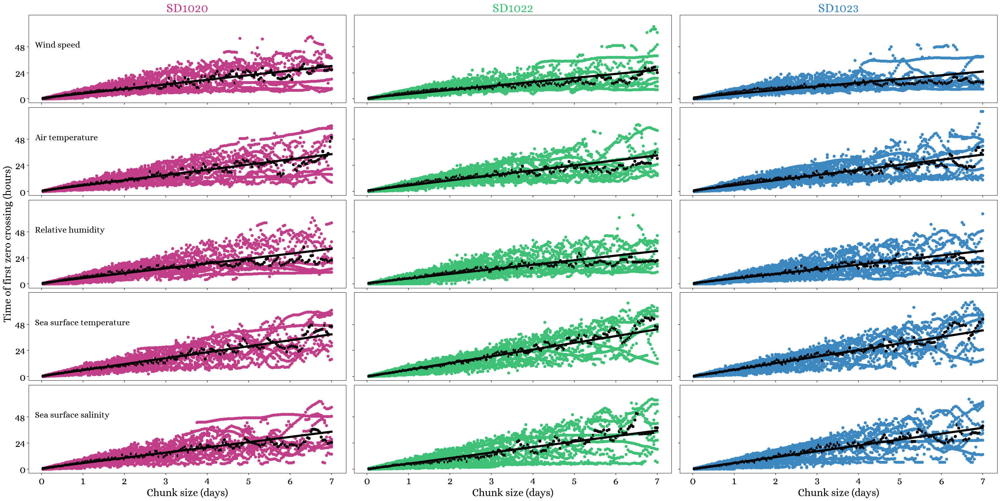

In [413]:
fig, AX = plt.subplots(5,3,figsize=(16*2, 8*2), constrained_layout=True, sharex=True, sharey=True)
variables = ['wind_speed', 'TEMP_AIR_MEAN', 'RH_MEAN', 'TEMP_CTD_RBR_MEAN', 'SAL_RBR_MEAN']
titles = ['Wind speed', 'Air temperature', 'Relative humidity', 'Sea surface temperature', 'Sea surface salinity']
drones = ['SD1020','SD1022','SD1023']

for ds,c,y,ax,d in zip([ds20,ds22,ds23],[c20,c22,c23],[True, False, False],AX.T,drones):
    for axs,var,t in zip(ax,variables,titles):
        plot_acv_and_median(axs, ds, var, c, y)
        if y:
            axs.set_title(t,loc='left',y=0.6, x=0.02, fontsize='small')
        if "wind" in var:
            axs.set_title(d,c=c)

In [420]:
wind_acf_20 = calc_acf(ds20, "wind_speed",0,95630)
airt_acf_20 = calc_acf(ds20, "TEMP_AIR_MEAN",0,95630)
rhum_acf_20 = calc_acf(ds20, "RH_MEAN",0,95630)
sst_acf_20  = calc_acf(ds20, "TEMP_CTD_RBR_MEAN",0,95630)
sss_acf_20  = calc_acf(ds20, "SAL_RBR_MEAN",0,95630)

wind_acf_22 = calc_acf(ds22, "wind_speed",0,137287)
airt_acf_22 = calc_acf(ds22, "TEMP_AIR_MEAN",0,137287)
rhum_acf_22 = calc_acf(ds22, "RH_MEAN",0,137287)
sst_acf_22  = calc_acf(ds22, "TEMP_CTD_RBR_MEAN",0,137287)
sss_acf_22 = calc_acf(ds22, "SAL_RBR_MEAN",0,137287)

wind_acf_23 = calc_acf(ds23, "wind_speed",0,100000)
airt_acf_23 = calc_acf(ds23, "TEMP_AIR_MEAN",0,100000)
rhum_acf_23 = calc_acf(ds23, "RH_MEAN",0,100000)
sst_acf_23  = calc_acf(ds23, "TEMP_CTD_RBR_MEAN",0,100000)
sss_acf_23  = calc_acf(ds23, "SAL_RBR_MEAN",0,100000)

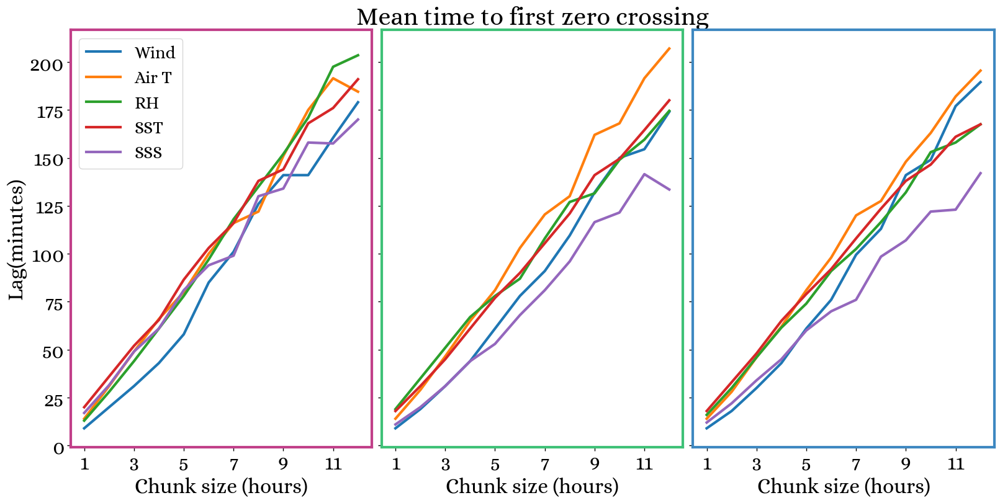

In [430]:
fig,ax=plt.subplots(1,3,figsize=(16,8),constrained_layout=True,sharex=True,sharey=True)

variables = ['wind_speed', 'TEMP_AIR_MEAN', 'RH_MEAN', 'TEMP_CTD_RBR_MEAN', 'SAL_RBR_MEAN']
titles = ['Wind', 'Air T', 'RH', 'SST', 'SSS']

for axs,ds,c,et,yl,t in zip(ax,
                       [ds20,ds22,ds23],
                       [c20,c22,c23],
                       [95630,137287,100000],
                       ['Lag(minutes)','',''],
                       ['','Mean time to first zero crossing','']):
    
    for var,l in zip(variables,titles):
        axs.plot(np.arange(1,13,1),calc_acf(ds, var, 0,et)[2][:12],label=l,lw=3)

    for spine in axs.spines.values():
        spine.set_color(c)
        spine.set_linewidth(3)
    axs.set(title=t,xlabel="Chunk size (hours)",ylabel=yl,xticks=np.arange(1,13,2))
    
ax[0].legend(ncols=1,frameon=True,fontsize='small')

plt.show()

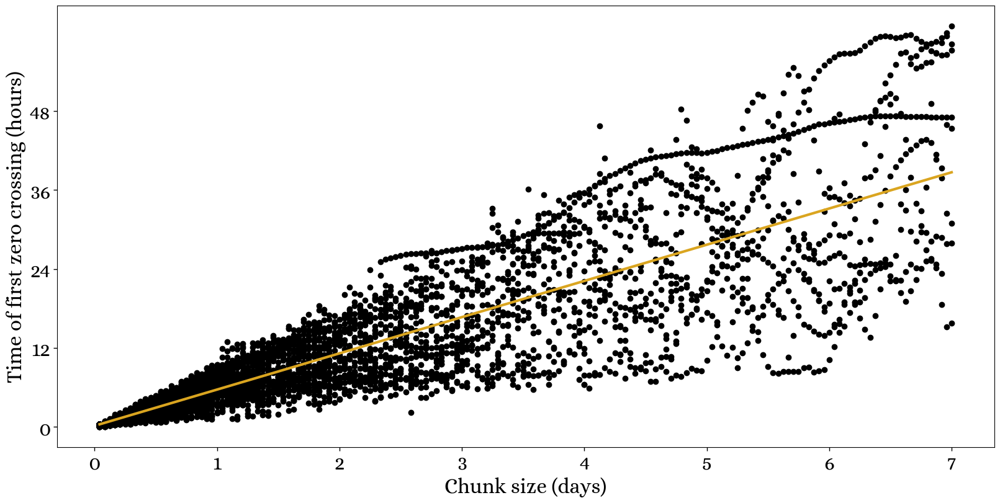

In [256]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True)

wacf  = []
chunk = []

for i in np.arange(60,60*24*7+1,60):
    acf = calc_acv(ds20, "TEMP_CTD_RBR_MEAN", i, 0, 90000, shift=0) 
    ax.scatter([i]*len(acf),acf,c='k')

    wacf.extend(acf)
    chunk.extend([i]*len(acf))

wacf  = np.array(wacf)
chunk = np.array(chunk)

reg_stats = linregress(chunk,wacf)

ax.plot(chunk,reg_stats.slope*chunk + reg_stats.intercept,c='goldenrod',lw=3) 

ax.set(xticks=np.arange(0,60*24*7+1,60*24),
       xticklabels=np.arange(0,8,1),
       xlabel='Chunk size (days)',
       yticks=np.arange(0,3600,12*60),
       yticklabels=np.arange(0,49,12),
       ylabel='Time of first zero crossing (hours)')
plt.show()

In [232]:
from scipy.stats import linregress

In [245]:
linregress(wacf,chunk)

LinregressResult(slope=4.0914559728540105, intercept=351.42045098238214, rvalue=0.8484406218755162, pvalue=0.0, stderr=0.027717411009122738, intercept_stderr=16.62974034167268)